In [ ]:
import os

os.environ['KAGGLE_CONFIG_DIR'] = '/content/'

In [ ]:
! chmod 600 /content/kaggle.json

In [ ]:
! kaggle datasets download -d ashkhagan/figshare-brain-tumor-dataset

 99% 833M/839M [00:06<00:00, 160MB/s]
100% 839M/839M [00:06<00:00, 135MB/s]


In [ ]:
import zipfile


zip_file_path = "/content/figshare-brain-tumor-dataset.zip"
extracted_dir = "/content/figshare-brain-tumor-dataset"


with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)

print("Dataset has been extracted to:", extracted_dir)


Dataset has been extracted to: /content/figshare-brain-tumor-dataset


In [ ]:
!pip install mat73

In [ ]:
!pip install livelossplot

In [ ]:
import os
import random
from tqdm import tqdm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import random
from IPython.display import Image
import imutils
from shutil import copyfile

from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

import keras
import tensorflow.keras as K
from tensorflow.keras.layers import Dropout, Dense
from tensorflow.keras.models import Model
from livelossplot.inputs.keras import PlotLossesCallback


import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator, array_to_img, img_to_array
from tensorflow.keras.applications import EfficientNetB1
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense, Conv2D, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import imutils

In [ ]:
import os
import numpy as np
from PIL import Image
from mat73 import loadmat
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow as tf
from collections import OrderedDict
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from IPython.display import Image, display
from tensorflow.keras.preprocessing.image import load_img
from PIL import ImageOps

In [ ]:
!pip install h5py

In [ ]:
import h5py

In [ ]:
import numpy as np
import pandas as pd
import os
from os import listdir
from os.path import isfile, join
import matplotlib.pyplot as plt
from natsort import natsorted, ns
import h5py
import sklearn as sk
from skimage.transform import resize
from numpy import load
from numpy import zeros
from numpy import ones

In [ ]:
mypath = "/content/figshare-brain-tumor-dataset/dataset/data"
filelist = natsorted([f for f in listdir(mypath) if isfile(join(mypath, f))])

In [ ]:
filelist100 = filelist[:]

In [ ]:
path = "/content/figshare-brain-tumor-dataset/dataset/data/"
imageDatalist = []
for i in range(0,100):
    f1 = h5py.File(path + filelist100[i],'r')
    list(f1.keys())
    imageDatalist.append(np.array(f1.get('cjdata/image/')))
    imageDatalist[i].reshape(512,512,1)
    imageDatalist[i] = resize(imageDatalist[i], (256, 256))

np.array(imageDatalist)

array([[[7.62560152e-06, 8.13978078e-07, 0.00000000e+00, ...,
         8.13978078e-07, 0.00000000e+00, 0.00000000e+00],
        [8.13978078e-07, 8.68863015e-08, 0.00000000e+00, ...,
         8.68863015e-08, 0.00000000e+00, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        ...,
        [8.13978078e-07, 8.68863015e-08, 0.00000000e+00, ...,
         8.68863015e-08, 0.00000000e+00, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],

       [[7.62560152e-06, 8.13978078e-07, 0.00000000e+00, ...,
         8.13978078e-07, 0.00000000e+00, 0.00000000e+00],
        [8.13978078e-07, 8.68863015e-08, 0.00000000e+00, ...,
         8.68863015e-08, 0.00000000e+00, 0.00000000e+00],
        [0.00000000e+00, 

In [ ]:
import os
import h5py
import numpy as np
from skimage.transform import resize
from skimage import img_as_ubyte

# Specify the path to the folder containing .mat files
path = "/content/figshare-brain-tumor-dataset/dataset/data/"
output_folder = "/content/brain/"

# Create output folder
os.makedirs(output_folder, exist_ok=True)

# List all files in the directory
filelist = os.listdir(path)

imageDatalist = []
for i, filename in enumerate(filelist[:]):
    try:
        # Load the .mat file
        f1 = h5py.File(os.path.join(path, filename), 'r')
        list(f1.keys())

        # Access the image data
        image_data = np.array(f1.get('cjdata/image/'))

        # Check if image data is empty or has invalid shape
        if image_data.size == 0 or image_data.shape != (512, 512):
            print(f"Invalid image data in {filename}. Skipping.")
            continue

        # Resize image
        image_data = resize(image_data, (256, 256))

        # Convert image to uint8 format
        image_data = img_as_ubyte(image_data)

        # Save image data as a PNG file
        output_path = os.path.join(output_folder, f"image_{i + 1}.png")
        cv2.imwrite(output_path, image_data)
        print(f"Saved {output_path}")

    except Exception as e:
        print(f"Error processing {filename}: {e}. Skipping.")


Saved /content/brain/image_1.png
Saved /content/brain/image_2.png
Saved /content/brain/image_3.png
Saved /content/brain/image_4.png
Saved /content/brain/image_5.png
Saved /content/brain/image_6.png
Saved /content/brain/image_7.png
Invalid image data in 1071.mat. Skipping.
Saved /content/brain/image_9.png
Saved /content/brain/image_10.png
Saved /content/brain/image_11.png
Saved /content/brain/image_12.png
Saved /content/brain/image_13.png
Saved /content/brain/image_14.png
Saved /content/brain/image_15.png
Saved /content/brain/image_16.png
Saved /content/brain/image_17.png
Saved /content/brain/image_18.png
Saved /content/brain/image_19.png
Saved /content/brain/image_20.png
Saved /content/brain/image_21.png
Saved /content/brain/image_22.png
Saved /content/brain/image_23.png
Saved /content/brain/image_24.png
Saved /content/brain/image_25.png
Saved /content/brain/image_26.png
Saved /content/brain/image_27.png
Saved /content/brain/image_28.png
Saved /content/brain/image_29.png
Saved /content

Shape of kaamKaDataStack: (100, 256, 256)


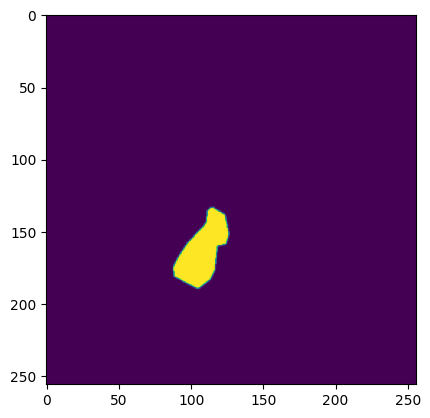

In [ ]:
import numpy as np
import pandas as pd
import os
from os import listdir
from os.path import isfile, join
import matplotlib.pyplot as plt
from natsort import natsorted, ns
import h5py
import tensorflow as tf
from skimage.transform import resize

# Set the path to the data
mypath = "/content/figshare-brain-tumor-dataset/dataset/data"

# Get a sorted list of file names
filelist = natsorted([f for f in listdir(mypath) if isfile(join(mypath, f))])

# Choose a subset of files (e.g., first 100)
filelist100 = filelist[:100]

# Load and preprocess data
path = "/content/figshare-brain-tumor-dataset/dataset/data/"
datalist = []

for i in range(100):
    with h5py.File(path + filelist100[i], 'r') as f:
        tumor_mask = np.array(f['cjdata/tumorMask/'])
        tumor_mask = resize(tumor_mask, (256, 256))  # Resize the image

        # Append the preprocessed data to datalist
        datalist.append(tumor_mask)

# Stack the data using TensorFlow
kaamKaDataStack = tf.stack(datalist, axis=0, name='stack')

# Check the shape of the stacked data
print("Shape of kaamKaDataStack:", kaamKaDataStack.shape)

# Visualize a sample (you may need to modify this depending on the shape of your data)
plt.imshow(tf.squeeze(kaamKaDataStack[0]))  # Squeeze to remove the singleton dimension
plt.show()


Shape of imageKaamKaDataStack: (100, 256, 256, 1)


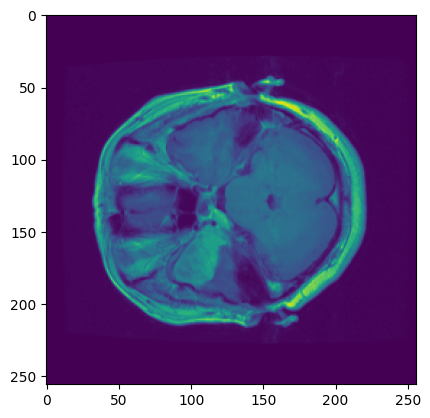

In [ ]:
import tensorflow as tf
import h5py
import numpy as np
from skimage.transform import resize
import matplotlib.pyplot as plt

# Assuming 'filelist100' is defined
# filelist100 = [:]  # Your list of file names

# Load and preprocess data
path = "/content/figshare-brain-tumor-dataset/dataset/data/"
imageDatalist = []

for i in range(0, 100):
    f1 = h5py.File(path + filelist100[i], 'r')
    list(f1.keys())
    image_data = np.array(f1.get('cjdata/image/'))
    image_data = resize(image_data, (256, 256, 1))  # Resize the image
    imageDatalist.append(image_data)

# Stack the data using TensorFlow
imageKaamKaDataStack = tf.stack(imageDatalist, axis=0, name='image_stack')

# Check the shape of the stacked data
print("Shape of imageKaamKaDataStack:", imageKaamKaDataStack.shape)

# Save the stacked data
np.savez("./image_stack.npz", imageKaamKaDataStack)

# Visualize a sample (you may need to modify this depending on the shape of your data)
plt.imshow(tf.squeeze(imageKaamKaDataStack[0]))  # Squeeze to remove the singleton dimension
plt.show()


Processing Images: 100%|██████████| 100/100 [00:04<00:00, 24.38it/s]


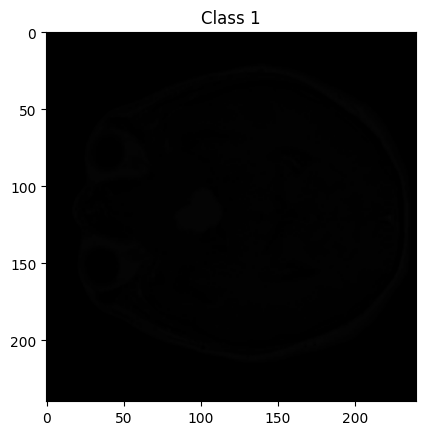

IndexError: ignored

In [ ]:
import os
from tqdm import tqdm  # If you don't have tqdm installed, you can install it using: pip install tqdm

# Assuming 'filelist100' is defined
# filelist100 = [...]  # Your list of file names
class_labels = ['1','2','3']  # Your list of class labels (e.g., [0, 1, 2] for three classes)

# Create directories to save the resized images
output_dir = "/content/resized_images/"
os.makedirs(output_dir, exist_ok=True)

for label in class_labels:
    class_dir = os.path.join(output_dir, f"class_{label}")
    os.makedirs(class_dir, exist_ok=True)

# Iterate through the data, split them into classes, resize, and save
for i, file_name in tqdm(enumerate(filelist100), total=len(filelist100), desc="Processing Images"):
    f1 = h5py.File(path + file_name, 'r')
    image_data = np.array(f1.get('cjdata/image/'))
    label = int(f1['cjdata/label'][()])  # Ensure label is an integer

    # Resize the image to (240, 240, 3)
    resized_image = resize(image_data, (240, 240, 3))

    # Save the resized image to the corresponding class directory
    save_path = os.path.join(output_dir, f"class_{label}", f"resized_image_{i}.png")
    plt.imsave(save_path, resized_image)

# Display a sample from each class
for label in class_labels:
    class_dir = os.path.join(output_dir, f"class_{label}")
    sample_image_path = os.path.join(class_dir, os.listdir(class_dir)[0])
    sample_image = plt.imread(sample_image_path)

    plt.imshow(sample_image)
    plt.title(f"Class {label}")
    plt.show()

In [ ]:
import os
import h5py
import numpy as np
from skimage.transform import resize
from skimage import img_as_ubyte
from skimage import exposure
import cv2

# Specify the path to the folder containing .mat files
path = "/content/figshare-brain-tumor-dataset/dataset/data/"
output_folder = "/content/out/"

# Create output folder
os.makedirs(output_folder, exist_ok=True)

# List all files in the directory
filelist = os.listdir(path)

imageDatalist = []
for i, filename in enumerate(filelist[:]):
    try:
        # Load the .mat file
        f1 = h5py.File(os.path.join(path, filename), 'r')
        list(f1.keys())

        # Access the image data
        image_data = np.array(f1.get('cjdata/image/'))

        # Check if image data is empty or has invalid shape
        if image_data.size == 0 or image_data.shape != (512, 512):
            print(f"Invalid image data in {filename}. Skipping.")
            continue

        # Resize image
        image_data = resize(image_data, (256, 256))

        # Enhance brightness using histogram equalization
        image_data = exposure.equalize_hist(image_data)

        # Convert image to uint8 format
        image_data = img_as_ubyte(image_data)

        # Save image data as a PNG file
        output_path = os.path.join(output_folder, f"image_{i + 1}.png")
        cv2.imwrite(output_path, image_data)
        print(f"Saved {output_path}")

    except Exception as e:
        print(f"Error processing {filename}: {e}. Skipping.")


Saved /content/out/image_1.png
Saved /content/out/image_2.png
Saved /content/out/image_3.png
Saved /content/out/image_4.png
Saved /content/out/image_5.png
Saved /content/out/image_6.png
Saved /content/out/image_7.png
Invalid image data in 1071.mat. Skipping.
Saved /content/out/image_9.png
Saved /content/out/image_10.png
Saved /content/out/image_11.png
Saved /content/out/image_12.png
Saved /content/out/image_13.png
Saved /content/out/image_14.png
Saved /content/out/image_15.png
Saved /content/out/image_16.png
Saved /content/out/image_17.png
Saved /content/out/image_18.png
Saved /content/out/image_19.png
Saved /content/out/image_20.png
Saved /content/out/image_21.png
Saved /content/out/image_22.png
Saved /content/out/image_23.png
Saved /content/out/image_24.png
Saved /content/out/image_25.png
Saved /content/out/image_26.png
Saved /content/out/image_27.png
Saved /content/out/image_28.png
Saved /content/out/image_29.png
Saved /content/out/image_30.png
Saved /content/out/image_31.png
Saved 

In [ ]:
import os
import h5py
import numpy as np
from skimage.transform import resize
from skimage import img_as_ubyte
from skimage import exposure
import cv2

# Specify the path to the folder containing .mat files
path = "/content/figshare-brain-tumor-dataset/dataset/data/"
output_folder = "/content/outa/"

# Create output folder
os.makedirs(output_folder, exist_ok=True)

# List all files in the directory
filelist = os.listdir(path)

# Create separate folders for each class
class_folders = {'class_1': os.path.join(output_folder, 'class_1'),
                 'class_2': os.path.join(output_folder, 'class_2'),
                 'class_3': os.path.join(output_folder, 'class_3')}

for folder in class_folders.values():
    os.makedirs(folder, exist_ok=True)

for i, filename in enumerate(filelist[:]):
    try:
        # Load the .mat file
        f1 = h5py.File(os.path.join(path, filename), 'r')
        list(f1.keys())

        # Access the image data
        image_data = np.array(f1.get('cjdata/image/'))

        # Check if image data is empty or has invalid shape
        if image_data.size == 0 or image_data.shape != (512, 512):
            print(f"Invalid image data in {filename}. Skipping.")
            continue

        # Resize image
        image_data = resize(image_data, (256, 256))

        # Enhance brightness using histogram equalization
        image_data = exposure.equalize_hist(image_data)

        # Convert image to uint8 format
        image_data = img_as_ubyte(image_data)

        # Get the label
        label = int(np.array(f1.get('cjdata/label')))

        # Save image data to the corresponding class folder
        output_path = os.path.join(class_folders[f'class_{label}'], f"image_{i + 1}.png")
        cv2.imwrite(output_path, image_data)
        print(f"Saved {output_path}")

    except Exception as e:
        print(f"Error processing {filename}: {e}. Skipping.")


Saved /content/outa/class_1/image_1.png
Saved /content/outa/class_2/image_2.png
Saved /content/outa/class_2/image_3.png
Saved /content/outa/class_3/image_4.png
Saved /content/outa/class_1/image_5.png
Saved /content/outa/class_2/image_6.png
Saved /content/outa/class_2/image_7.png
Invalid image data in 1071.mat. Skipping.
Saved /content/outa/class_1/image_9.png
Saved /content/outa/class_1/image_10.png
Saved /content/outa/class_2/image_11.png
Saved /content/outa/class_2/image_12.png
Saved /content/outa/class_2/image_13.png
Saved /content/outa/class_2/image_14.png
Saved /content/outa/class_2/image_15.png
Saved /content/outa/class_2/image_16.png
Saved /content/outa/class_3/image_17.png
Saved /content/outa/class_1/image_18.png
Saved /content/outa/class_2/image_19.png
Saved /content/outa/class_2/image_20.png
Saved /content/outa/class_1/image_21.png
Saved /content/outa/class_2/image_22.png
Saved /content/outa/class_3/image_23.png
Saved /content/outa/class_3/image_24.png
Saved /content/outa/cla

In [ ]:
import os
import h5py
import numpy as np
from skimage.transform import resize
from skimage import img_as_ubyte
from skimage import exposure
import cv2

# Specify the path to the folder containing .mat files
path = "/content/figshare-brain-tumor-dataset/dataset/data/"
output_folder = "/content/outb/"

# Create output folder
os.makedirs(output_folder, exist_ok=True)

# List all files in the directory
filelist = os.listdir(path)

# Create separate folders for each class
class_folders = {'class_1': os.path.join(output_folder, 'class_1'),
                 'class_2': os.path.join(output_folder, 'class_2'),
                 'class_3': os.path.join(output_folder, 'class_3')}

for folder in class_folders.values():
    os.makedirs(folder, exist_ok=True)

for i, filename in enumerate(filelist[:]):
    try:
        # Load the .mat file
        f1 = h5py.File(os.path.join(path, filename), 'r')
        list(f1.keys())

        # Access the image data
        image_data = np.array(f1.get('cjdata/image/'))

        # Check if image data is empty or has invalid shape
        if image_data.size == 0 or image_data.shape != (512, 512):
            print(f"Invalid image data in {filename}. Skipping.")
            continue

        # Resize image
        image_data = resize(image_data, (240, 240))

        # Enhance brightness using histogram equalization
        image_data = exposure.equalize_hist(image_data)

        # Convert image to uint8 format
        image_data = img_as_ubyte(image_data)

        # Get the label
        label = int(np.array(f1.get('cjdata/label')))

        # Save image data to the corresponding class folder
        output_path = os.path.join(class_folders[f'class_{label}'], f"image_{i + 1}.png")
        cv2.imwrite(output_path, image_data)
        print(f"Saved {output_path}")

    except Exception as e:
        print(f"Error processing {filename}: {e}. Skipping.")


Saved /content/outb/class_1/image_1.png
Saved /content/outb/class_2/image_2.png
Saved /content/outb/class_2/image_3.png
Saved /content/outb/class_3/image_4.png
Saved /content/outb/class_1/image_5.png
Saved /content/outb/class_2/image_6.png
Saved /content/outb/class_2/image_7.png
Invalid image data in 1071.mat. Skipping.
Saved /content/outb/class_1/image_9.png
Saved /content/outb/class_1/image_10.png
Saved /content/outb/class_2/image_11.png
Saved /content/outb/class_2/image_12.png
Saved /content/outb/class_2/image_13.png
Saved /content/outb/class_2/image_14.png
Saved /content/outb/class_2/image_15.png
Saved /content/outb/class_2/image_16.png
Saved /content/outb/class_3/image_17.png
Saved /content/outb/class_1/image_18.png
Saved /content/outb/class_2/image_19.png
Saved /content/outb/class_2/image_20.png
Saved /content/outb/class_1/image_21.png
Saved /content/outb/class_2/image_22.png
Saved /content/outb/class_3/image_23.png
Saved /content/outb/class_3/image_24.png
Saved /content/outb/cla

In [ ]:
# Verification step
for class_folder in class_folders.values():
    for image_file in os.listdir(class_folder):
        image_path = os.path.join(class_folder, image_file)
        image = cv2.imread(image_path)
        if image.shape != (240, 240, 3):
            print(f"Verification failed for {image_path}. Dimensions: {image.shape}")
        else:
            print(f"Verification successful for {image_path}. Dimensions: {image.shape}")


Verification successful for /content/outb/class_1/image_1280.png. Dimensions: (240, 240, 3)
Verification successful for /content/outb/class_1/image_1826.png. Dimensions: (240, 240, 3)
Verification successful for /content/outb/class_1/image_1132.png. Dimensions: (240, 240, 3)
Verification successful for /content/outb/class_1/image_2672.png. Dimensions: (240, 240, 3)
Verification successful for /content/outb/class_1/image_2446.png. Dimensions: (240, 240, 3)
Verification successful for /content/outb/class_1/image_1373.png. Dimensions: (240, 240, 3)
Verification successful for /content/outb/class_1/image_879.png. Dimensions: (240, 240, 3)
Verification successful for /content/outb/class_1/image_388.png. Dimensions: (240, 240, 3)
Verification successful for /content/outb/class_1/image_68.png. Dimensions: (240, 240, 3)
Verification successful for /content/outb/class_1/image_1671.png. Dimensions: (240, 240, 3)
Verification successful for /content/outb/class_1/image_482.png. Dimensions: (240, 2

In [ ]:
import os
import h5py
import numpy as np
from skimage.transform import resize
from skimage import img_as_ubyte
from skimage import exposure
import cv2

# Specify the path to the folder containing .mat files
path = "/content/figshare-brain-tumor-dataset/dataset/data/"
output_folder = "/content/oute/"

# Create output folder
os.makedirs(output_folder, exist_ok=True)

# List all files in the directory
filelist = os.listdir(path)

# Create a mapping between class labels and real names
class_mapping = {1: 'meningioma', 2: 'glioma', 3: 'pituitary'}

# Create separate folders for each class with real names
class_folders = {f'class_{label}': os.path.join(output_folder, class_mapping[label]) for label in class_mapping}

for folder in class_folders.values():
    os.makedirs(folder, exist_ok=True)

for i, filename in enumerate(filelist[:]):
    try:
        # Load the .mat file
        f1 = h5py.File(os.path.join(path, filename), 'r')
        list(f1.keys())

        # Access the image data
        image_data = np.array(f1.get('cjdata/image/'))

        # Check if image data is empty or has invalid shape
        if image_data.size == 0 or image_data.shape != (512, 512):
            print(f"Invalid image data in {filename}. Skipping.")
            continue

        # Resize image
        image_data = resize(image_data, (240, 240))

        # Enhance brightness using histogram equalization
        image_data = exposure.equalize_hist(image_data)

        # Convert image to uint8 format
        image_data = img_as_ubyte(image_data)

        # Get the label
        label = int(np.array(f1.get('cjdata/label')))

        # Save image data to the corresponding class folder with real names
        output_path = os.path.join(class_folders[f'class_{label}'], f"image_{i + 1}.png")
        cv2.imwrite(output_path, image_data)
        print(f"Saved {output_path}")

    except Exception as e:
        print(f"Error processing {filename}: {e}. Skipping.")


Saved /content/oute/meningioma/image_1.png
Saved /content/oute/glioma/image_2.png
Saved /content/oute/glioma/image_3.png
Saved /content/oute/pituitary/image_4.png
Saved /content/oute/meningioma/image_5.png
Saved /content/oute/glioma/image_6.png
Saved /content/oute/glioma/image_7.png
Invalid image data in 1071.mat. Skipping.
Saved /content/oute/meningioma/image_9.png
Saved /content/oute/meningioma/image_10.png
Saved /content/oute/glioma/image_11.png
Saved /content/oute/glioma/image_12.png
Saved /content/oute/glioma/image_13.png
Saved /content/oute/glioma/image_14.png
Saved /content/oute/glioma/image_15.png
Saved /content/oute/glioma/image_16.png
Saved /content/oute/pituitary/image_17.png
Saved /content/oute/meningioma/image_18.png
Saved /content/oute/glioma/image_19.png
Saved /content/oute/glioma/image_20.png
Saved /content/oute/meningioma/image_21.png
Saved /content/oute/glioma/image_22.png
Saved /content/oute/pituitary/image_23.png
Saved /content/oute/pituitary/image_24.png
Saved /con

In [ ]:
# Verification step
for class_folder in class_folders.values():
    for image_file in os.listdir(class_folder):
        image_path = os.path.join(class_folder, image_file)
        image = cv2.imread(image_path)
        if image.shape != (240, 240, 3):
            print(f"Verification failed for {image_path}. Dimensions: {image.shape}")
        else:
            print(f"Verification successful for {image_path}. Dimensions: {image.shape}")


Verification successful for /content/oute/meningioma/image_1280.png. Dimensions: (240, 240, 3)
Verification successful for /content/oute/meningioma/image_1826.png. Dimensions: (240, 240, 3)
Verification successful for /content/oute/meningioma/image_1132.png. Dimensions: (240, 240, 3)
Verification successful for /content/oute/meningioma/image_2672.png. Dimensions: (240, 240, 3)
Verification successful for /content/oute/meningioma/image_2446.png. Dimensions: (240, 240, 3)
Verification successful for /content/oute/meningioma/image_1373.png. Dimensions: (240, 240, 3)
Verification successful for /content/oute/meningioma/image_879.png. Dimensions: (240, 240, 3)
Verification successful for /content/oute/meningioma/image_388.png. Dimensions: (240, 240, 3)
Verification successful for /content/oute/meningioma/image_68.png. Dimensions: (240, 240, 3)
Verification successful for /content/oute/meningioma/image_1671.png. Dimensions: (240, 240, 3)
Verification successful for /content/oute/meningioma/i

In [ ]:
import shutil

# Specify the directory path you want to delete
directory_to_delete = "/content/brain"

# Use shutil.rmtree to delete the entire directory and its contents
shutil.rmtree(directory_to_delete)


In [ ]:
#create directory for training data
os.mkdir('/content/Crop-Brain-MRI')
os.mkdir('/content/Crop-Brain-MRI/glioma_tumor')
os.mkdir('/content/Crop-Brain-MRI/meningioma_tumor')
os.mkdir('/content/Crop-Brain-MRI/pituitary_tumor')
os.mkdir('/content/Crop-Brain-MRI/no_tumor')

In [ ]:
#create directory for testing data
os.mkdir('/content/Test-Data')
os.mkdir('/content/Test-Data/glioma_tumor')
os.mkdir('/content/Test-Data/meningioma_tumor')
os.mkdir('/content/Test-Data/pituitary_tumor')
os.mkdir('/content/Test-Data/no_tumor')

In [ ]:
combined_dir = '/content/combined_data'
shuffled_dir = '/content/shuffled_data'
train_combined_dir = '/content/train_combined_data'
test_combined_dir = '/content/test_combined_data'

In [ ]:
import os
import random
from shutil import copyfile

# Define paths
input_dir = "/content/oute"
train_dir = "/content/train"
test_dir = "/content/test"
combined_dir = "/content/combined"

# Create directories for combined and shuffled data
os.makedirs(combined_dir, exist_ok=True)

# Classes
classes = ['glioma', 'meningioma', 'pituitary']

# Combine images from class directories into combined directory
for class_name in classes:
    class_combined_dir = os.path.join(combined_dir, class_name)

    os.makedirs(class_combined_dir, exist_ok=True)

    for image_name in os.listdir(os.path.join(input_dir, class_name)):
        copyfile(os.path.join(input_dir, class_name, image_name), os.path.join(class_combined_dir, image_name))

# Shuffle the combined data with a specific random state
random_seed = 42
random.seed(random_seed)

# Split the shuffled data into train and test directories
for class_name in classes:
    class_combined_dir = os.path.join(combined_dir, class_name)
    class_train_dir = os.path.join(train_dir, class_name)
    class_test_dir = os.path.join(test_dir, class_name)

    os.makedirs(class_train_dir, exist_ok=True)
    os.makedirs(class_test_dir, exist_ok=True)

    all_images = os.listdir(class_combined_dir)
    random.shuffle(all_images)

    # Determine the split indices
    total_images = len(all_images)
    train_split = int(0.8 * total_images)

    # Copy shuffled images to the train directory
    for image_name in all_images[:train_split]:
        source_path = os.path.join(class_combined_dir, image_name)
        target_path = os.path.join(class_train_dir, image_name)
        copyfile(source_path, target_path)

    # Copy images to the test directory
    for image_name in all_images[train_split:]:
        source_path = os.path.join(class_combined_dir, image_name)
        target_path = os.path.join(class_test_dir, image_name)
        copyfile(source_path, target_path)

# Display the number of images in the train and test directories
for class_name in classes:
    print(f"Number of images in {class_name} train_dir: {len(os.listdir(os.path.join(train_dir, class_name)))}")
    print(f"Number of images in {class_name} test_dir: {len(os.listdir(os.path.join(test_dir, class_name)))}")


Number of images in glioma train_dir: 1140
Number of images in glioma test_dir: 286
Number of images in meningioma train_dir: 566
Number of images in meningioma test_dir: 142
Number of images in pituitary train_dir: 732
Number of images in pituitary test_dir: 183


In [ ]:
#create classes
classes = os.listdir('/content/train')

In [ ]:
classes

['meningioma', 'glioma', 'pituitary']

In [ ]:
files_path_dict = {}

for c in classes:
  files_path_dict[c] = list(map(lambda x: train_dir + '/' + c + '/' + x, os.listdir(train_dir + '/' + c )))

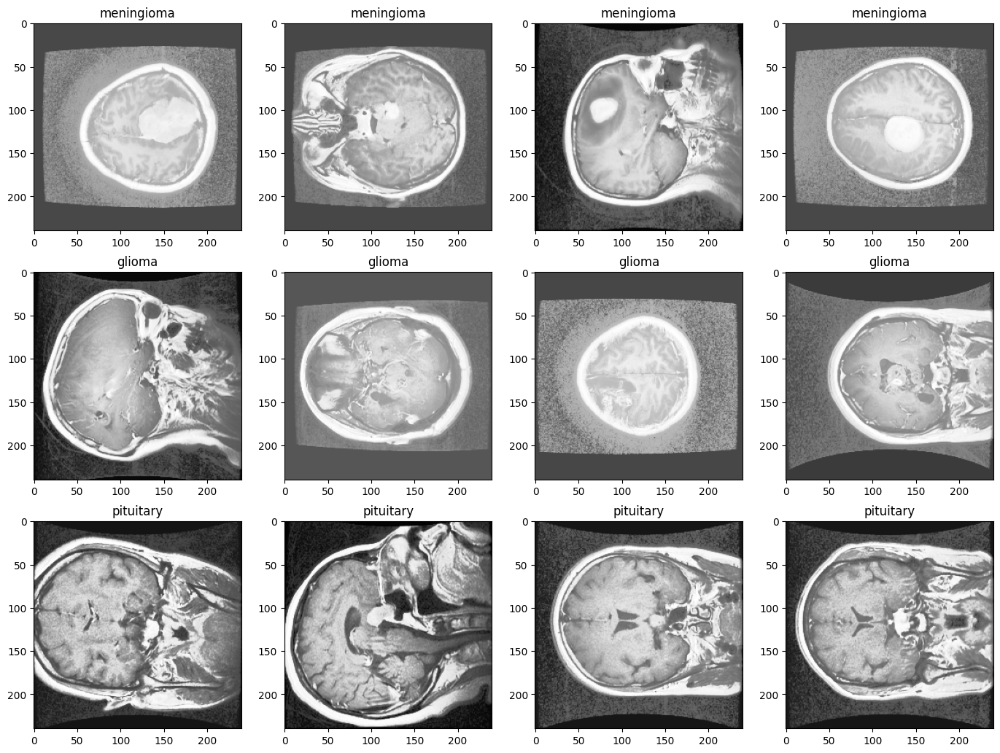

In [ ]:
plt.figure(figsize = (17,17))
index = 0
for c in classes:
  random.shuffle(files_path_dict[c])
  path_list = files_path_dict[c][:5]

  for i in range(1, 5):
    index += 1
    plt.subplot(4, 4, index)
    plt.imshow(load_img(path_list[i]))
    plt.title(c)

In [ ]:
#check the number of images in each class in the training dataset
No_images_per_class = []
Class_name = []

for i in os.listdir('/content/train'):
  train_class = os.listdir(os.path.join('/content/train', i))
  No_images_per_class.append(len(train_class))
  Class_name.append(i)
  print('Number of images in {} = {} \n'.format(i, len(train_class)))

Number of images in meningioma = 566 

Number of images in glioma = 1140 

Number of images in pituitary = 732 



In [ ]:
import plotly.express as px


# Plot histogram using plotly express
classname2 = px.bar(x=Class_name, y=No_images_per_class,
                   title='Distribution of No_images_per_class',
                   labels={'x': 'Class Name', 'y': 'Number of Images'},
                   color_discrete_sequence=['darkturquoise'],
                   )
classname2.update_yaxes(showgrid=False)
classname2.update_xaxes(categoryorder='total descending')
classname2.update_traces(hovertemplate=None)
classname2.update_layout(margin=dict(t=100, b=0, l=70, r=40),
                        hovermode="x unified",
                        xaxis_tickangle=0,
                        xaxis_title='Class Name', yaxis_title="Number of Images",
                        plot_bgcolor='midnightblue', paper_bgcolor='midnightblue',
                        title_font=dict(size=25, color='white', family="Muli, sans-serif"),
                        font=dict(color='white'),
                        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
                          )

# Show the plot
classname2.show()


In [ ]:
def crop_image(image, plot=False):

    #convert to grayscale
    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    #blur
    img_gray = cv2.GaussianBlur(img_gray, (5, 5), 0)

    #apply binary threshhold
    img_thresh = cv2.threshold(img_gray, 100, 255, cv2.THRESH_BINARY)[1]

    #apply erosion
    img_thresh = cv2.erode(img_thresh, None, iterations=2)

    #dilate images
    img_thresh = cv2.dilate(img_thresh, None, iterations=2)

    #find shapes or the contour of images
    contours = cv2.findContours(img_thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    #grab contours
    contours = imutils.grab_contours(contours)

    #find biggest contour
    c = max(contours, key=cv2.contourArea)

    #extract contour positions
    extLeft = tuple(c[c[:, :, 0].argmin()][0])
    extRight = tuple(c[c[:, :, 0].argmax()][0])
    extTop = tuple(c[c[:, :, 1].argmin()][0])
    extBot = tuple(c[c[:, :, 1].argmax()][0])

    #generate new image
    new_image = image[extTop[1]:extBot[1], extLeft[0]:extRight[0]]

    #plot
    if plot:
        plt.figure(figsize=(15, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.tick_params(axis='both', which='both', top=False, bottom=False, left=False, right=False,labelbottom=False, labeltop=False, labelleft=False, labelright=False)
        plt.title('Original Image')
        plt.subplot(1, 2, 2)
        plt.imshow(new_image)
        plt.tick_params(axis='both', which='both',top=False, bottom=False, left=False, right=False,labelbottom=False, labeltop=False, labelleft=False, labelright=False)
        plt.title('Cropped Image')
        plt.show()

    return new_image


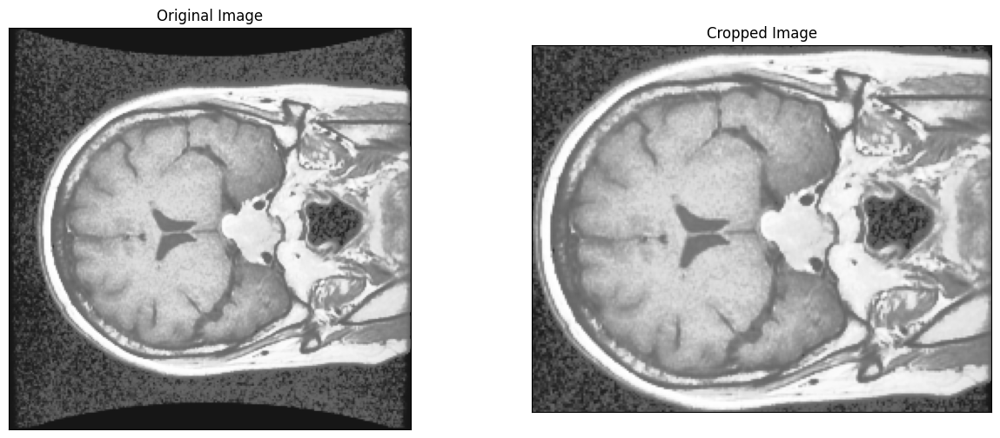

In [ ]:
example_image = cv2.imread('/content/train/pituitary/image_1054.png')
cropped_image = crop_image(example_image, plot=True)

In [ ]:
#specify directory
train_dir = '/content/train'
test_dir = '/content/test'

In [ ]:
#crop training images and save it to the directory we previously created
glioma = train_dir + '/' + 'glioma'
meningioma = train_dir + '/' + 'meningioma'
pituitary = train_dir + '/' + 'pituitary'

j = 0
for i in tqdm(os.listdir(glioma)):
  path = os.path.join(glioma, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Crop-Brain-MRI/glioma_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

j = 0
for i in tqdm(os.listdir(meningioma)):
  path = os.path.join(meningioma, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Crop-Brain-MRI/meningioma_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

j = 0
for i in tqdm(os.listdir(pituitary)):
  path = os.path.join(pituitary, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Crop-Brain-MRI/pituitary_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

# j = 0
# for i in tqdm(os.listdir(no_tumor)):
#   path = os.path.join(no_tumor, i)
#   img = cv2.imread(path)
#   img = crop_image(img, plot=False)

#   if img is not None:
#     img = cv2.resize(img, (240, 240))
#     save_path = '/content/Crop-Brain-MRI/no_tumor/' + str(j) + '.jpg'
#     cv2.imwrite(save_path, img)
#     j = j + 1

100%|██████████| 732/732 [00:02<00:00, 324.34it/s]


In [ ]:
#crop testing images and save it to the directory we previously created
test_glioma = test_dir + '/' + 'glioma'
test_meningioma = test_dir + '/' + 'meningioma'
test_pituitary = test_dir + '/' + 'pituitary'

j = 0
for i in tqdm(os.listdir(test_glioma)):
  path = os.path.join(test_glioma, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Test-Data/glioma_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

j = 0
for i in tqdm(os.listdir(test_meningioma)):
  path = os.path.join(test_meningioma, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Test-Data/meningioma_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

j = 0
for i in tqdm(os.listdir(test_pituitary)):
  path = os.path.join(test_pituitary, i)
  img = cv2.imread(path)
  img = crop_image(img, plot=False)

  if img is not None:
    img = cv2.resize(img, (240, 240))
    save_path = '/content/Test-Data/pituitary_tumor/' + str(j) + '.jpg'
    cv2.imwrite(save_path, img)
    j = j + 1

# j = 0
# for i in tqdm(os.listdir(test_no_tumor)):
#   path = os.path.join(test_no_tumor, i)
#   img = cv2.imread(path)
#   img = crop_image(img, plot=False)

#   if img is not None:
#     img = cv2.resize(img, (240, 240))
#     save_path = '/content/Test-Data/no_tumor/' + str(j) + '.jpg'
#     cv2.imwrite(save_path, img)
#     j = j + 1


100%|██████████| 183/183 [00:00<00:00, 335.10it/s]


In [ ]:
#use Image Data Generator to perform this task
#train set
datagen = ImageDataGenerator(rotation_range=10,
                             height_shift_range=0.2,
                             horizontal_flip=True,
                             validation_split=0.2)

train_data = datagen.flow_from_directory('/content/Crop-Brain-MRI/',
                                         target_size=(240, 240),
                                         batch_size=32,
                                         class_mode='categorical',
                                         subset='training')

valid_data = datagen.flow_from_directory('/content/Crop-Brain-MRI/',
                                         target_size=(240, 240),
                                         batch_size=32,
                                         class_mode='categorical',
                                         subset='validation')

#test set
test_datagen = ImageDataGenerator()

test_data = datagen.flow_from_directory('/content/Test-Data/',
                                         target_size=(240, 240),
                                        class_mode='categorical',
                                        shuffle=False)


Found 1951 images belonging to 4 classes.
Found 487 images belonging to 4 classes.
Found 611 images belonging to 4 classes.


In [ ]:
#view the class dictionary
print(train_data.class_indices)
print(test_data.class_indices)

{'glioma_tumor': 0, 'meningioma_tumor': 1, 'no_tumor': 2, 'pituitary_tumor': 3}
{'glioma_tumor': 0, 'meningioma_tumor': 1, 'no_tumor': 2, 'pituitary_tumor': 3}


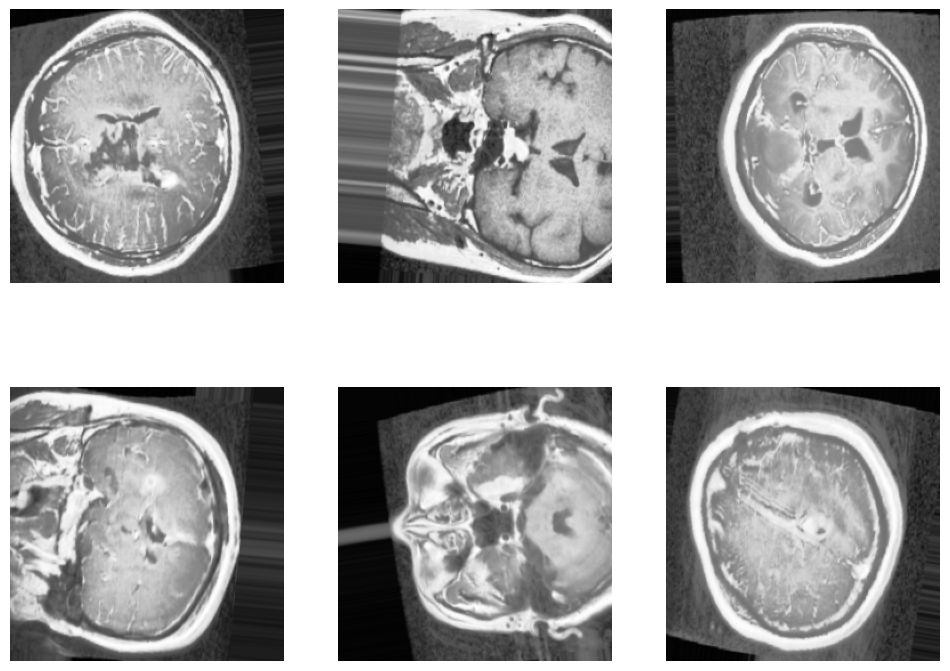

In [ ]:
#view the augmented data
sample_x, sample_y = next(train_data)
plt.figure(figsize=(12, 9))
for i in range(6):
  plt.subplot(2, 3, i+1)
  sample = array_to_img(sample_x[i])
  plt.axis('off')
  plt.grid(False)
  plt.imshow(sample)
plt.show()

In [ ]:
#build the model
effnet = EfficientNetB1(weights='imagenet',
                        include_top=False,
                        input_shape=(240, 240, 3))

model = effnet.output
model = GlobalAveragePooling2D()(model)
model = Dropout(0.5)(model)
model = Dense(4, activation='softmax')(model)
model = Model(inputs=effnet.input,
              outputs=model)

#get summary()
model.summary()

27018416/27018416 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 240, 240, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 240, 240, 3)          0         ['input_1[0][0]']             
                                                                                                  
 normalization (Normalizati  (None, 240, 240, 3)          7         ['rescaling[0][0]']           
 on)                                                                                              
                                                                                                  
 rescaling_1 (Rescaling)     

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.864086 to fit



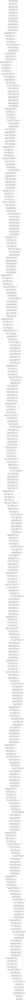

In [ ]:
from tensorflow.keras.utils import plot_model

plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
#compile model
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#define checkpoint
checkpoint = ModelCheckpoint('model.h5',
                             monitor='val_accuracy',
                             save_best_only=True,
                             mode='auto',
                             verbose=1)

#early stopping
earlystop = EarlyStopping(monitor='val_accuracy',
                          patience=5,
                          mode='auto',
                          verbose=1)

#reduce learning rate
reduce_lr = ReduceLROnPlateau(monitor = 'val_accuracy',
                              factor = 0.3,
                              patience = 2,
                              min_delta = 0.001,
                              mode='auto',
                              verbose=1)

In [ ]:
%%time

#train the model
history = model.fit(train_data,
                    epochs = 30,
                    validation_data=valid_data,
                    verbose=1,
                    callbacks=[checkpoint, earlystop, reduce_lr])

Epoch 1/30
61/61 [==============================] - ETA: 0s - loss: 0.7628 - accuracy: 0.7002
Epoch 1: val_accuracy improved from -inf to 0.81109, saving model to model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



61/61 [==============================] - 107s 829ms/step - loss: 0.7628 - accuracy: 0.7002 - val_loss: 0.4871 - val_accuracy: 0.8111 - lr: 1.0000e-04
Epoch 2/30
61/61 [==============================] - ETA: 0s - loss: 0.2785 - accuracy: 0.8944
Epoch 2: val_accuracy improved from 0.81109 to 0.88090, saving model to model.h5
61/61 [==============================] - 44s 727ms/step - loss: 0.2785 - accuracy: 0.8944 - val_loss: 0.3361 - val_accuracy: 0.8809 - lr: 1.0000e-04
Epoch 3/30
61/61 [==============================] - ETA: 0s - loss: 0.1800 - accuracy: 0.9359
Epoch 3: val_accuracy improved from 0.88090 to 0.90349, saving model to model.h5
61/61 [==============================] - 46s 742ms/step - loss: 0.1800 - accuracy: 0.9359 - val_loss: 0.2591 - val_accuracy: 0.9035 - lr: 1.0000e-04
Epoch 4/30
61/61 [==============================] - ETA: 0s - loss: 0.1210 - accuracy: 0.9559
Epoch 4: val_accuracy did not improve from 0.90349
61/61 [==============================] - 43s 711ms/step -

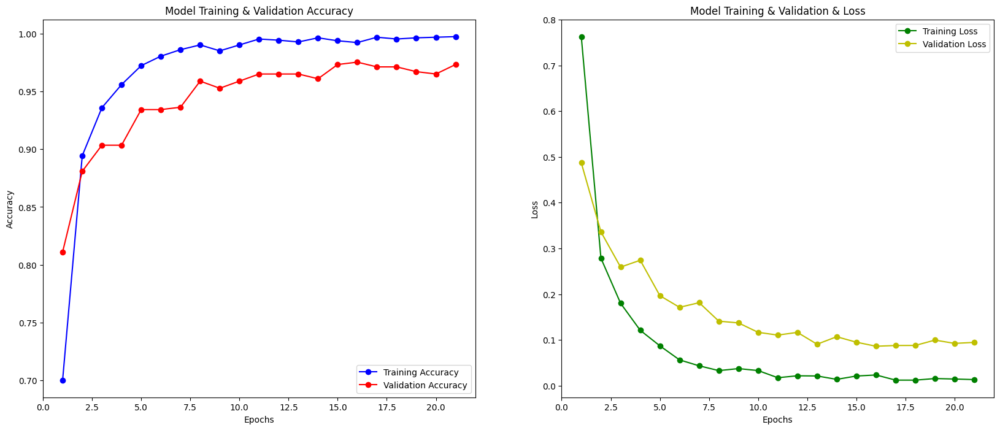

In [ ]:
fig , ax = plt.subplots(1,2)
fig.set_size_inches(20, 8)

train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

epochs = range(1, len(train_acc) + 1)

ax[0].plot(epochs , train_acc , 'b-o' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'r-o' , label = 'Validation Accuracy')
ax[0].set_title('Model Training & Validation Accuracy')
ax[0].legend(loc = 'lower right')
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'y-o' , label = 'Validation Loss')
ax[1].set_title('Model Training & Validation & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

In [ ]:
print('Train accuracy & loss:', model.evaluate(train_data))
print('\n')
print('Test accuracy & loss:', model.evaluate(test_data))

61/61 [==============================] - 30s 489ms/step - loss: 0.0016 - accuracy: 1.0000
Train accuracy & loss: [0.0016116953920572996, 1.0]


20/20 [==============================] - 10s 520ms/step - loss: 0.0872 - accuracy: 0.9771
Test accuracy & loss: [0.08721619099378586, 0.9770867228507996]


In [ ]:
#define labels for testing
y_test = test_data.classes

#make prediction
yhat_test = np.argmax(model.predict(test_data), axis=1)

20/20 [==============================] - 11s 465ms/step


In [ ]:
y_test

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [ ]:
yhat_test

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 3, 1, 1, 1, 0, 1, 1, 3, 1, 1, 1, 1, 1, 1,

In [ ]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize = False,
                          title = 'Confusion Matrix',
                          cmap = plt.cm.Blues):

    plt.figure(figsize = (6,6))
    plt.imshow(cm, interpolation = 'nearest', cmap = cmap)
    plt.title(title)
    plt.colorbar()
    plt.grid(False)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation = 90)
    plt.yticks(tick_marks, classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis = 1)[:, np.newaxis]

    thresh = cm.max() / 2.
    cm = np.round(cm,2)
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 fontsize = 12,
                 horizontalalignment = "center",
                 color = "white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

[[282   4   0]
 [  7 128   7]
 [  0   0 183]]


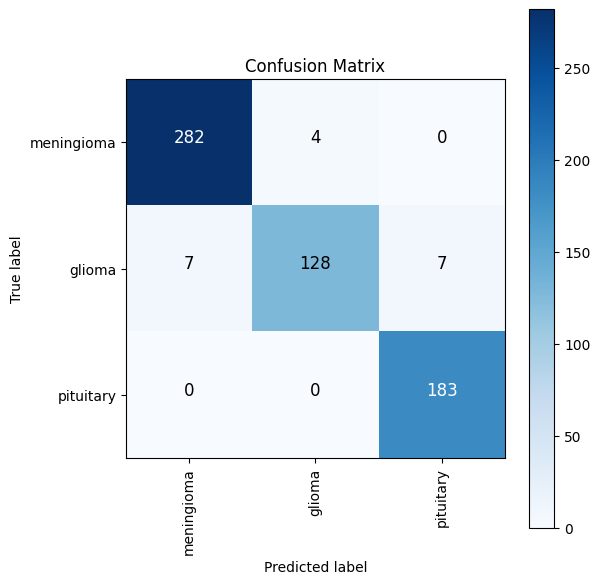

In [ ]:
#get confusion matrix
cm = confusion_matrix(y_test, yhat_test)
print(cm)

#plot
plot_confusion_matrix(cm, classes, normalize=False)

In [ ]:
#get classification report
print(classification_report(y_test, yhat_test))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98       286
           1       0.97      0.90      0.93       142
           3       0.96      1.00      0.98       183

    accuracy                           0.97       611
   macro avg       0.97      0.96      0.97       611
weighted avg       0.97      0.97      0.97       611



In [ ]:
import plotly.graph_objects as go
report = classification_report(y_test, yhat_test, target_names=Class_name, output_dict=True)

# Extract precision and recall for each class
precision = [report[class_name]['precision'] for class_name in Class_name]
recall = [report[class_name]['recall'] for class_name in Class_name]
f1_score = [report[class_name]['f1-score'] for class_name in Class_name]
Accuracy = report['accuracy']

# Create a grouped bar plot for precision and recall
fig = go.Figure()

fig.add_trace(go.Bar(x=Class_name, y=precision, name='Precision', marker_color='darkcyan'))
fig.add_trace(go.Bar(x=Class_name, y=recall, name='Recall', marker_color='darkturquoise'))
fig.add_trace(go.Bar(x=Class_name, y=recall, name='f1_score', marker_color='red'))
fig.add_trace(go.Bar(x=Class_name, y=recall, name='Accuracy', marker_color='brown'))

fig.update_layout(barmode='group', title='Precision and Recall for Each Class',
                  xaxis_title='Class Name', yaxis_title='Score', showlegend=True)

fig.update_layout(margin=dict(t=100, b=0, l=70, r=40),
                        hovermode="x unified",
                        xaxis_tickangle=0,
                        xaxis_title='Class Name', yaxis_title="Number of Images",
                        plot_bgcolor='midnightblue', paper_bgcolor='midnightblue',
                        title_font=dict(size=25, color='white', family="Muli, sans-serif"),
                        font=dict(color='white'),
                        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
                          )

fig.show()

In [ ]:
import PIL

class_dict = {0: 'glioma_tumor',
              1: 'meningioma_tumor',
              2: 'no_tumor',
              3: 'pituitary_tumor'}

prediction = []
original = []
image = []
count = 0
for i in os.listdir('/content/Test-Data/'):
  for item in os.listdir(os.path.join('/content/Test-Data', i)):
    # code to open the image
    img= PIL.Image.open(os.path.join('/content/Test-Data', i, item))
    #append to image list
    image.append(img)
    #expand dimension
    img = np.expand_dims(img, axis=0)
    #predict
    predict = model.predict(img)
    #get the index corresponding to the highest value in the prediction
    predict = np.argmax(predict)
    #append the predicted class to the list
    prediction.append(class_dict[predict])
    #append original class to the list
    original.append(i)

1/1 [==============================] - 0s 28ms/step


In [ ]:
prediction

['glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor',
 'glioma_tumor

In [ ]:
#test accuracy
score = accuracy_score(original, prediction)
print("Test Accuracy : {}".format(score))

Test Accuracy : 0.9770867430441899


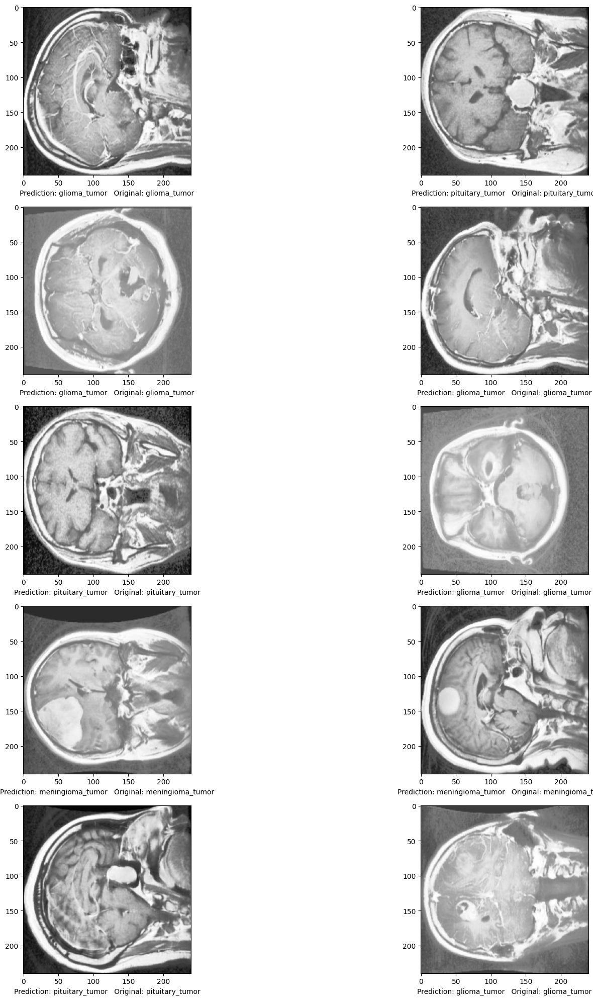

In [ ]:
#visualize the results
fig = plt.figure(figsize = (20, 20))
for i in range(10):
    j = random.randint(0, len(image)-1)
    fig.add_subplot(5, 2, i+1)
    plt.xlabel("Prediction: " + prediction[j] +"   Original: " + original[j])
    plt.imshow(image[j])
fig.tight_layout()
plt.show()

In [ ]:
last_conv_layer = next(x for x in model.layers[::-1] if isinstance(x, K.layers.Conv2D))
last_conv_layer.name

'top_conv'

In [ ]:
#https://github.com/gkeechin/vizgradcam/blob/main/gradcam.py

def VizGradCAM(model, image, interpolant=0.5, plot_results=True):

    #sanity check
    assert (interpolant > 0 and interpolant < 1), "Heatmap Interpolation Must Be Between 0 - 1"

    #STEP 1: Preprocesss image and make prediction using our model
    #input image
    original_img = np.asarray(image, dtype = np.float32)
    #expamd dimension and get batch size
    img = np.expand_dims(original_img, axis=0)
    #predict
    prediction = model.predict(img)
    #prediction index
    prediction_idx = np.argmax(prediction)


    #STEP 2: Create new model
    #specify last convolutional layer
    last_conv_layer = next(x for x in model.layers[::-1] if isinstance(x, K.layers.Conv2D))
    target_layer = model.get_layer(last_conv_layer.name)

    #compute gradient of top predicted class
    with tf.GradientTape() as tape:
        #create a model with original model inputs and the last conv_layer as the output
        gradient_model = Model([model.inputs], [target_layer.output, model.output])
        #pass the image through the base model and get the feature map
        conv2d_out, prediction = gradient_model(img)
        #prediction loss
        loss = prediction[:, prediction_idx]

    #gradient() computes the gradient using operations recorded in context of this tape
    gradients = tape.gradient(loss, conv2d_out)

    #obtain the output from shape [1 x H x W x CHANNEL] -> [H x W x CHANNEL]
    output = conv2d_out[0]

    #obtain depthwise mean
    weights = tf.reduce_mean(gradients[0], axis=(0, 1))


    #create a 7x7 map for aggregation
    activation_map = np.zeros(output.shape[0:2], dtype=np.float32)
    #multiply weight for every layer
    for idx, weight in enumerate(weights):
        activation_map += weight * output[:, :, idx]
    #resize to image size
    activation_map = cv2.resize(activation_map.numpy(),
                                (original_img.shape[1],
                                 original_img.shape[0]))
    #ensure no negative number
    activation_map = np.maximum(activation_map, 0)
    #convert class activation map to 0 - 255
    activation_map = (activation_map - activation_map.min()) / (activation_map.max() - activation_map.min())
    #rescale and convert the type to int
    activation_map = np.uint8(255 * activation_map)


    #convert to heatmap
    heatmap = cv2.applyColorMap(activation_map, cv2.COLORMAP_JET)

    #superimpose heatmap onto image
    original_img = np.uint8((original_img - original_img.min()) / (original_img.max() - original_img.min()) * 255)
    cvt_heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    cvt_heatmap = img_to_array(cvt_heatmap)

    #enlarge plot
    plt.rcParams["figure.dpi"] = 100

    if plot_results == True:
        plt.imshow(np.uint8(original_img * interpolant + cvt_heatmap * (1 - interpolant)))
    else:
        return cvt_heatmap

1/1 [==============================] - 0s 30ms/step


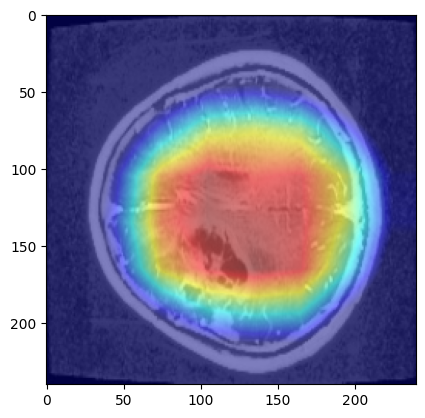

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/glioma_tumor/100.jpg")

#apply function
VizGradCAM(model, img_to_array(test_img), plot_results=True)

In [ ]:
effnet_svm = EfficientNetB1(weights='imagenet', include_top=False, input_shape=(240, 240, 3))

# Build the new layers
x = effnet_svm.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.345)(x)  # Add the first Dropout layer with a dropout ratio of 0.345
x = Dense(69, activation='relu')(x)  # Add the first Dense layer with 69 neurons and ReLU activation
x = Dropout(0.183)(x)  # Add the second Dropout layer with a dropout ratio of 0.183
x = Dense(69, activation='relu')(x)  # Add the second Dense layer with 69 neurons and ReLU activation

# For the classification layer, use Softmax for now
num_classes = 4  # Set the number of classes 
predictions = Dense(num_classes, activation='softmax')(x)  # Add the classification layer with Softmax activation

# Build the final model
model2 = Model(inputs=effnet_svm.input, outputs=predictions)
model2.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 240, 240, 3)]        0         []                            
                                                                                                  
 rescaling_6 (Rescaling)     (None, 240, 240, 3)          0         ['input_4[0][0]']             
                                                                                                  
 normalization_3 (Normaliza  (None, 240, 240, 3)          7         ['rescaling_6[0][0]']         
 tion)                                                                                            
                                                                                                  
 rescaling_7 (Rescaling)     (None, 240, 240, 3)          0         ['normalization_3[0][0]'

In [ ]:
model2.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
plot_loss_1 = PlotLossesCallback()
checkpoint = ModelCheckpoint('model2.h5', monitor='val_accuracy', save_best_only=True, mode='auto', verbose=1)
earlystop = EarlyStopping(monitor='val_accuracy', patience=5, mode='auto', verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.3, patience=2, min_delta=0.001, mode='auto', verbose=1)

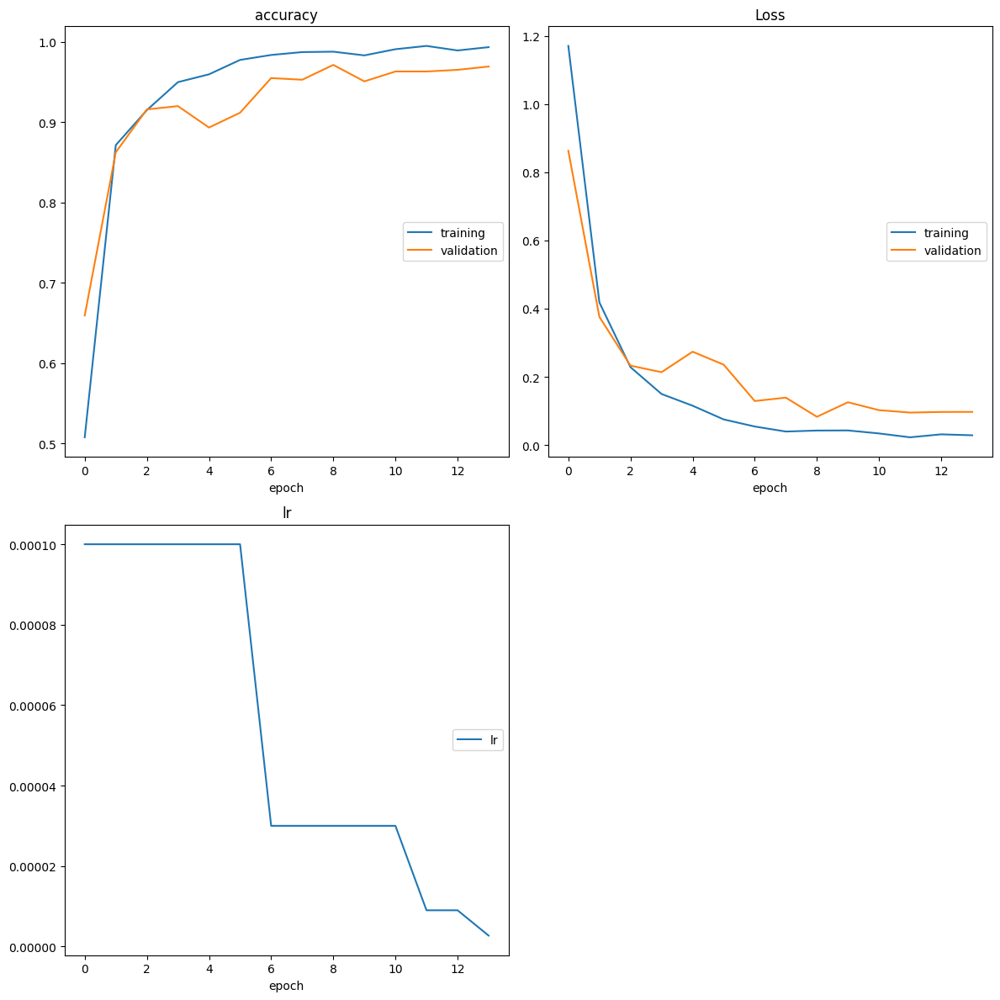

accuracy
	training         	 (min:    0.507, max:    0.995, cur:    0.993)
	validation       	 (min:    0.659, max:    0.971, cur:    0.969)
Loss
	training         	 (min:    0.023, max:    1.170, cur:    0.029)
	validation       	 (min:    0.083, max:    0.863, cur:    0.097)
lr
	lr               	 (min:    0.000, max:    0.000, cur:    0.000)
61/61 [==============================] - 48s 790ms/step - loss: 0.0287 - accuracy: 0.9933 - val_loss: 0.0972 - val_accuracy: 0.9692 - lr: 2.7000e-06
Epoch 14: early stopping


In [ ]:
plot_loss_2 = PlotLossesCallback()
history2 = model2.fit(train_data,
                    epochs=30,
                    validation_data=valid_data,
                    verbose=1,
                    callbacks=[checkpoint, earlystop, reduce_lr, plot_loss_2])

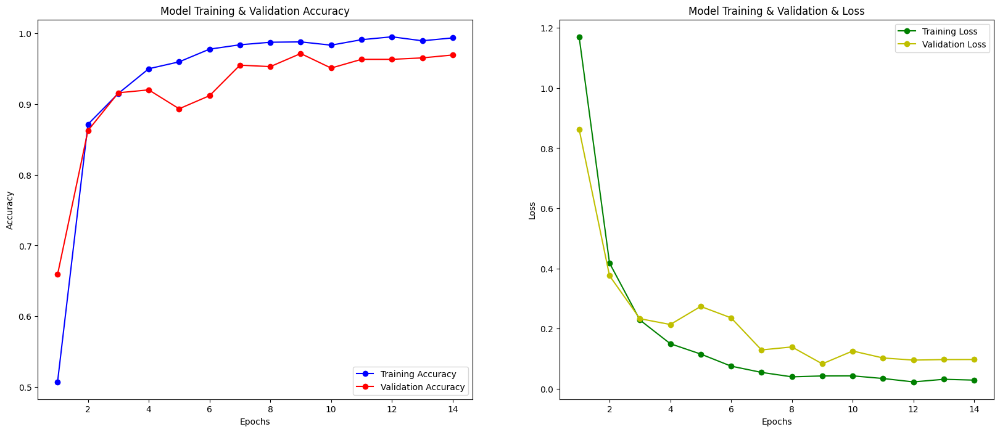

In [ ]:
fig , ax = plt.subplots(1,2)
fig.set_size_inches(20, 8)

train_acc = history2.history['accuracy']
train_loss = history2.history['loss']
val_acc = history2.history['val_accuracy']
val_loss = history2.history['val_loss']

epochs = range(1, len(train_acc) + 1)

ax[0].plot(epochs , train_acc , 'b-o' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'r-o' , label = 'Validation Accuracy')
ax[0].set_title('Model Training & Validation Accuracy')
ax[0].legend(loc = 'lower right')
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'y-o' , label = 'Validation Loss')
ax[1].set_title('Model Training & Validation & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

In [ ]:
print('Train accuracy & loss:', model2.evaluate(train_data))
print('\n')
print('Test accuracy & loss:', model2.evaluate(test_data))

61/61 [==============================] - 28s 461ms/step - loss: 0.0052 - accuracy: 0.9985
Train accuracy & loss: [0.005216443911194801, 0.9984623193740845]


20/20 [==============================] - 8s 400ms/step - loss: 0.0869 - accuracy: 0.9705
Test accuracy & loss: [0.08692746609449387, 0.9705401062965393]


In [ ]:
#define labels for testing
y_test = test_data.classes

#make prediction
yhat_test = np.argmax(model2.predict(test_data), axis=1)

20/20 [==============================] - 11s 461ms/step


[[277   9   0]
 [  4 132   6]
 [  0   2 181]]


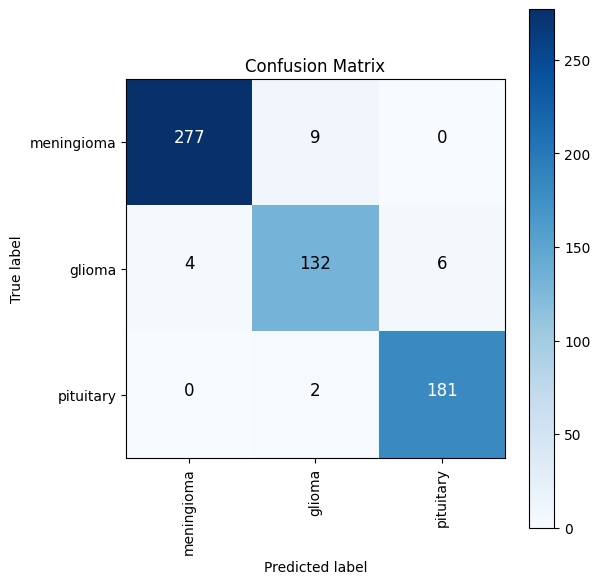

In [ ]:
#get confusion matrix
cm = confusion_matrix(y_test, yhat_test)
print(cm)

#plot
plot_confusion_matrix(cm, classes, normalize=False)

In [ ]:
#get classification report
print(classification_report(y_test, yhat_test))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98       286
           1       0.92      0.93      0.93       142
           3       0.97      0.99      0.98       183

    accuracy                           0.97       611
   macro avg       0.96      0.96      0.96       611
weighted avg       0.97      0.97      0.97       611



In [ ]:
import plotly.graph_objects as go
report = classification_report(y_test, yhat_test, target_names=Class_name, output_dict=True)

# Extract precision and recall for each class
precision = [report[class_name]['precision'] for class_name in Class_name]
recall = [report[class_name]['recall'] for class_name in Class_name]
f1_score = [report[class_name]['f1-score'] for class_name in Class_name]
Accuracy = report['accuracy']

# Create a grouped bar plot for precision and recall
fig = go.Figure()

fig.add_trace(go.Bar(x=Class_name, y=precision, name='Precision', marker_color='darkcyan'))
fig.add_trace(go.Bar(x=Class_name, y=recall, name='Recall', marker_color='darkturquoise'))
fig.add_trace(go.Bar(x=Class_name, y=recall, name='f1_score', marker_color='red'))
fig.add_trace(go.Bar(x=Class_name, y=recall, name='Accuracy', marker_color='brown'))

fig.update_layout(barmode='group', title='Precision and Recall for Each Class',
                  xaxis_title='Class Name', yaxis_title='Score', showlegend=True)

fig.update_layout(margin=dict(t=100, b=0, l=70, r=40),
                        hovermode="x unified",
                        xaxis_tickangle=0,
                        xaxis_title='Class Name', yaxis_title="Number of Images",
                        plot_bgcolor='midnightblue', paper_bgcolor='midnightblue',
                        title_font=dict(size=25, color='white', family="Muli, sans-serif"),
                        font=dict(color='white'),
                        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
                          )

fig.show()

In [ ]:
import PIL

class_dict = {0: 'glioma_tumor',
              1: 'meningioma_tumor',
              2: 'no_tumor',
              3: 'pituitary_tumor'}

prediction = []
original = []
image = []
count = 0
for i in os.listdir('/content/Test-Data/'):
  for item in os.listdir(os.path.join('/content/Test-Data', i)):
    # code to open the image
    img= PIL.Image.open(os.path.join('/content/Test-Data', i, item))
    #append to image list
    image.append(img)
    #expand dimension
    img = np.expand_dims(img, axis=0)
    #predict
    predict = model2.predict(img)
    #get the index corresponding to the highest value in the prediction
    predict = np.argmax(predict)
    #append the predicted class to the list
    prediction.append(class_dict[predict])
    #append original class to the list
    original.append(i)

1/1 [==============================] - 0s 30ms/step


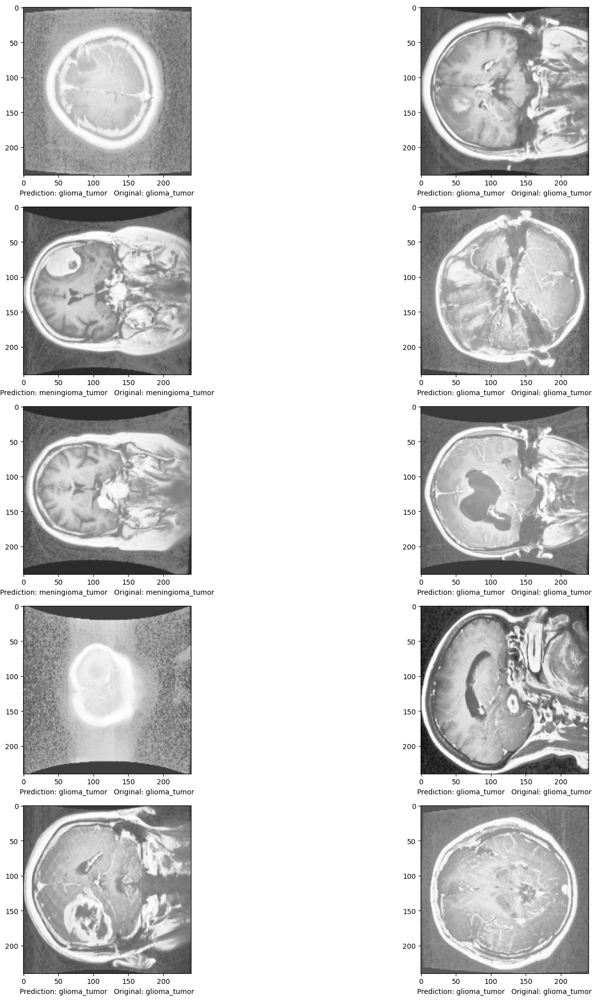

In [ ]:
#visualize the results
fig = plt.figure(figsize = (20, 20))
for i in range(10):
    j = random.randint(0, len(image)-1)
    fig.add_subplot(5, 2, i+1)
    plt.xlabel("Prediction: " + prediction[j] +"   Original: " + original[j])
    plt.imshow(image[j])
fig.tight_layout()
plt.show()

1/1 [==============================] - 0s 32ms/step


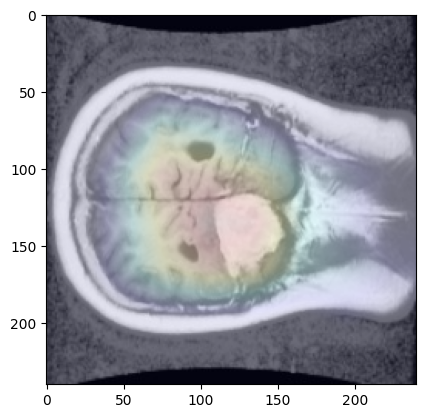

In [ ]:
#load image
test_img = cv2.imread("/content/Test-Data/meningioma_tumor/0.jpg")

#apply function
VizGradCAM(model2, img_to_array(test_img), plot_results=True)